# Reliance Industries
### Stock Analysis and Forecasting

## Business Objective

Predict the Reliance Industries Stock Price for the next 30 days.

There are Open, High, Low and Close prices that you need to obtain from the web for each day starting from 2000 to 2023 for Reliance Industries stock.

- Split the last year into a test set- to build a model to predict stock price.

- Find short term, & long term trends.

- Understand how it is impacted from external factors or any big external events.

- Forecast for next 30 days.

## Collection of Dataset

- For this project, we will be using the Yfinance library to get the data, which makes it easy to process.

- We collected data from 1-Jan-2000 to 14-Aug-2023.

- But also you can download data from ‘Yahoo! Finance’ website. You can use Below link. 

- https://query1.finance.yahoo.com/v7/finance/download/RELIANCE.NS?period1=946684800&period2=1691971200&interval=1d&events=history&includeAdjustedClose=true

## About the data

- Date: Date of trade

- Open: Opening Price of Stock

- High: Highest price of stock on that day

- Low: Lowest price of stock on that day

- Close: Close price adjusted for splits.

- Adj  Close: Adjusted close price adjusted for splits and dividend and/or capital gain distributions.

- Volume: Volume of stock on that day

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf

import warnings
warnings.filterwarnings("ignore")

In [67]:
# Importing dataset
df = pd.read_csv("RELIANCE.NS.csv")

In [68]:
df.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684196,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060581,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316601,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714108,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096401,128426756.0
5,2000-01-10,49.110077,49.311222,47.237892,47.733013,36.382893,86714866.0
6,2000-01-11,47.647915,48.112095,43.919018,44.638493,34.024208,81074352.0
7,2000-01-12,44.715855,47.191475,43.655979,46.680878,35.580936,78264129.0
8,2000-01-13,47.346199,48.955353,47.052219,48.251347,36.777981,110363002.0
9,2000-01-14,47.887741,49.767666,47.887741,48.939880,37.302792,86996234.0


In [69]:
df.tail(10)

,Date,Open,High,Low,Close,Adj Close,Volume
5897,2023-07-31,2527.850098,2553.899902,2517.949951,2549.250000,2549.250000,4275587.0
5898,2023-08-01,2555.000000,2559.000000,2505.300049,2513.199951,2513.199951,4768316.0
5899,2023-08-02,2509.199951,2512.000000,2463.600098,2486.350098,2486.350098,6374107.0
5900,2023-08-03,2475.300049,2500.899902,2458.050049,2475.899902,2475.899902,5084175.0
5901,2023-08-04,2498.800049,2516.000000,2471.600098,2509.550049,2509.550049,11442805.0
5902,2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2523.850098,2991435.0
5903,2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,2508.649902,4922036.0
5904,2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,2525.199951,5743293.0
5905,2023-08-10,2524.949951,2550.000000,2508.449951,2536.449951,2536.449951,7735299.0
5906,2023-08-11,2532.449951,2558.850098,2512.350098,2547.149902,2547.149902,11089665.0


# EDA

Analysis is only based on Open, High, Low, close price and volume

There is no need of Adj Close

In [70]:
# Removing "Adj Close" columnfrom dataset
df1=df.drop(["Adj Close"],axis=1).reset_index(drop=True)
df1

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...,...
5902,2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
5903,2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
5904,2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0
5905,2023-08-10,2524.949951,2550.000000,2508.449951,2536.449951,7735299.0


In [71]:
# Finding duplicate columns, if any
df1[df1.duplicated()]

,Date,Open,High,Low,Close,Volume


In [72]:
# Finding null values, if any
df1.isnull().sum()

Date       0
Open      10
High      10
Low       10
Close     10
Volume    10
dtype: int64

In [73]:
#To check which rows have any missing value under any column
df1[df1.isnull().any(axis=1)]

,Date,Open,High,Low,Close,Volume
855,2003-04-14,NaN,NaN,NaN,NaN,NaN
1125,2004-04-26,NaN,NaN,NaN,NaN,NaN
1247,2004-10-13,NaN,NaN,NaN,NaN,NaN
2563,2010-02-06,NaN,NaN,NaN,NaN,NaN
3041,2012-01-07,NaN,NaN,NaN,NaN,NaN
3080,2012-03-03,NaN,NaN,NaN,NaN,NaN
3210,2012-09-08,NaN,NaN,NaN,NaN,NaN
3252,2012-11-11,NaN,NaN,NaN,NaN,NaN
3589,2014-03-22,NaN,NaN,NaN,NaN,NaN
3818,2015-02-28,NaN,NaN,NaN,NaN,NaN


In [74]:
# Forward Imputation
df1 = df1.fillna(method='ffill')

In [75]:
df1.isnull().sum()

Date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

In [76]:
# Removing the row which have null value
df2=df1.dropna().reset_index(drop=True)
df2

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...,...
5902,2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
5903,2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
5904,2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0
5905,2023-08-10,2524.949951,2550.000000,2508.449951,2536.449951,7735299.0


In [77]:
# Checking wether if there exist any null values
df2[df2.isnull().any(axis=1)]

,Date,Open,High,Low,Close,Volume


In [78]:
# Making a copy of dataset as reliance
df=df2.copy()
df

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...,...
5902,2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
5903,2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
5904,2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0
5905,2023-08-10,2524.949951,2550.000000,2508.449951,2536.449951,7735299.0


#### Discriptive Statistics

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5907 entries, 0 to 5906
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    5907 non-null   object 
 1   Open    5907 non-null   float64
 2   High    5907 non-null   float64
 3   Low     5907 non-null   float64
 4   Close   5907 non-null   float64
 5   Volume  5907 non-null   float64
dtypes: float64(5), object(1)
memory usage: 277.0+ KB


In [80]:
df.describe()

,Open,High,Low,Close,Volume
count,5907.000000,5907.000000,5907.000000,5907.000000,5.907000e+03
mean,684.603584,692.667929,675.890021,683.969323,1.654504e+07
std,729.795959,737.165700,721.834099,729.229279,1.793429e+07
min,31.796223,33.962387,30.504259,31.440351,0.000000e+00
25%,114.613392,116.945885,113.565121,114.683022,6.214368e+06
50%,455.135773,463.060638,449.241638,454.318512,9.990413e+06
75%,793.342407,803.335175,786.333832,793.651977,1.992871e+07
max,2856.149902,2856.149902,2797.000000,2841.850098,2.918015e+08


In [81]:
df.corr()

,Open,High,Low,Close,Volume
Open,1.000000,0.999882,0.999874,0.999756,-0.331101
High,0.999882,1.000000,0.999840,0.999902,-0.329416
Low,0.999874,0.999840,1.000000,0.999894,-0.332442
Close,0.999756,0.999902,0.999894,1.000000,-0.330757
Volume,-0.331101,-0.329416,-0.332442,-0.330757,1.000000


- Every attributes are highly corelated except volume

In [82]:
# converting the date column in to datetime 
df['Date']=pd.to_datetime(df['Date'],format='%Y-%m-%d')
df

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...,...
5902,2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
5903,2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
5904,2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0
5905,2023-08-10,2524.949951,2550.000000,2508.449951,2536.449951,7735299.0


In [83]:
# Setting the date column as index
df=df.set_index('Date')
df

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...
2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0


### Visualizations

Text(0.5, 1.0, 'Close')

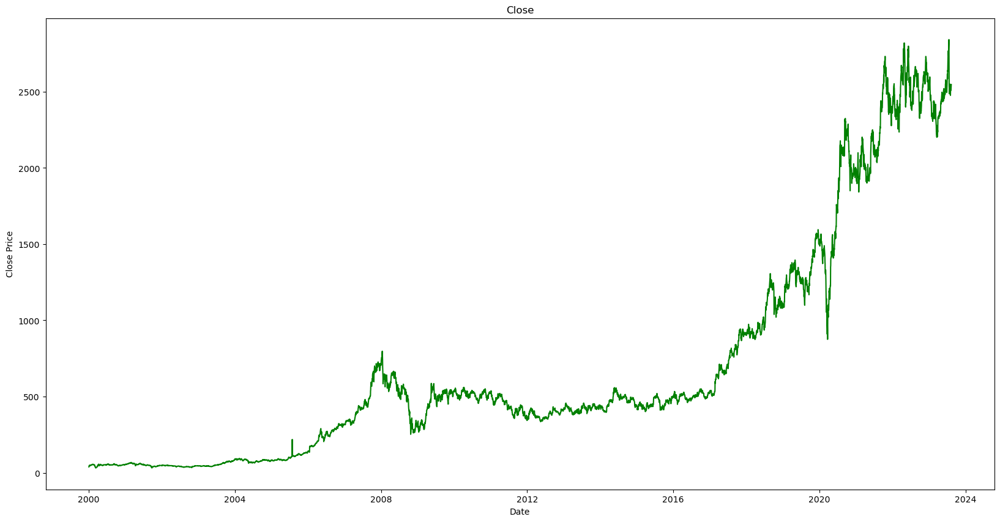

In [84]:
plt.figure(figsize=(20,10))

#Close Column Plot

plt.plot(df['Close'],color='green')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Close')


Text(0.5, 1.0, 'Close')

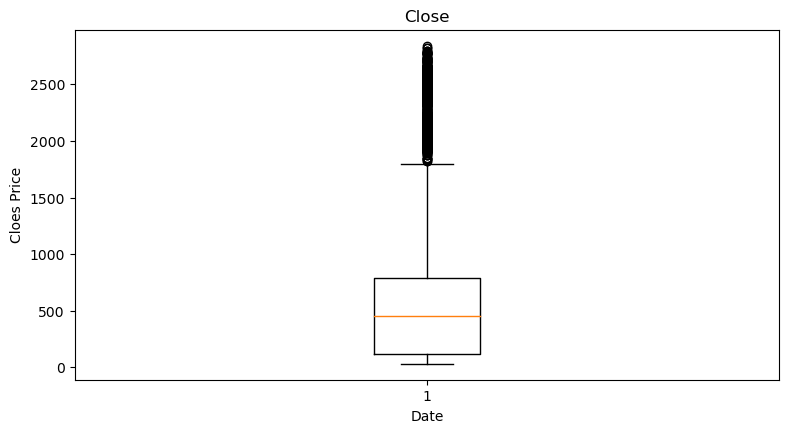

In [85]:
# Creating box-plots
plt.figure(figsize=(20,10))

#Close Column Plot
plt.subplot(2,2,2)
plt.boxplot(df['Close'])
plt.xlabel('Date')
plt.ylabel('Cloes Price')
plt.title('Close')


From the box plot it is clear that there are no outliers inthe dataset

Text(0.5, 1.0, 'Close')

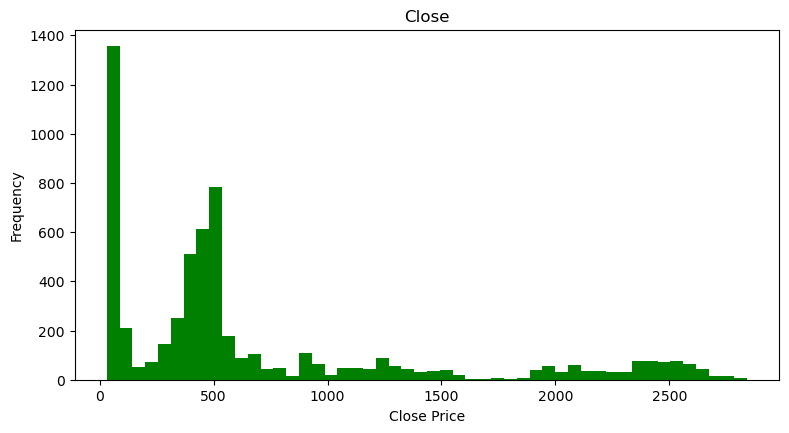

In [86]:
# Ploting Histogram
plt.figure(figsize=(20,10))
#Close Column Plot
plt.subplot(2,2,2)
plt.hist(df['Close'],bins=50, color='green')
plt.xlabel("Close Price")
plt.ylabel("Frequency")
plt.title('Close')


Text(0.5, 1.0, 'Close')

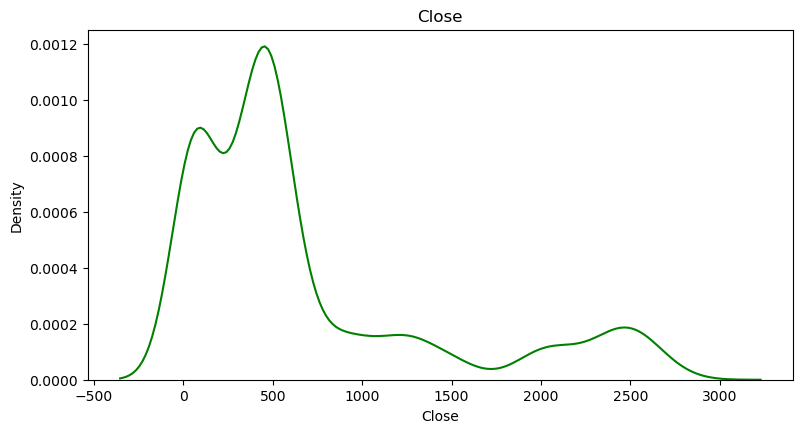

In [87]:
# KDE-Plots
plt.figure(figsize=(20,10))
#Close Column Plot
plt.subplot(2,2,2)
sns.kdeplot(df['Close'], color='green')
plt.title('Close')


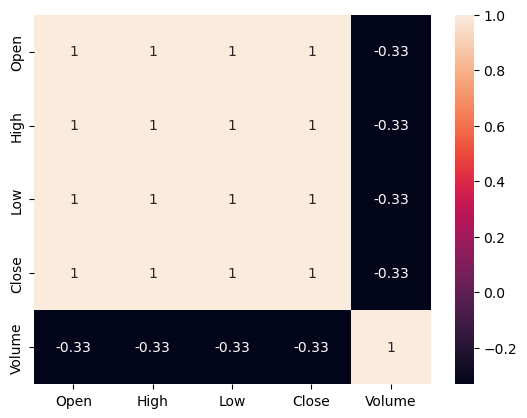

In [88]:
sns.heatmap(df.corr(),annot=True)
plt.show()

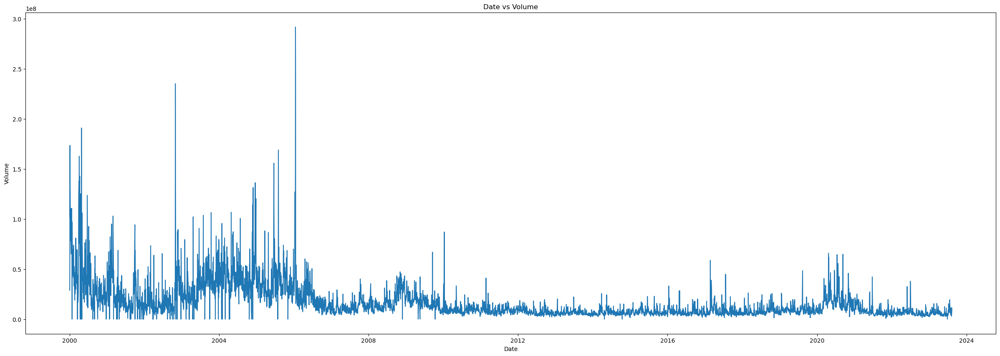

In [89]:
figure=plt.figure(figsize=(30,10))
plt.plot(df['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Date vs Volume')
plt.show()

## Finding long-term and short-term trends

### Moving Average

In [90]:
df_ma=df.copy()
df_ma['30-day MA']=df['Close'].rolling(window=30).mean()
df_ma['200-day MA']=df['Close'].rolling(window=200).mean()

In [91]:
df_ma

,Open,High,Low,Close,Volume,30-day MA,200-day MA
Date,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0,NaN,NaN
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0,NaN,NaN
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0,NaN,NaN
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0,NaN,NaN
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0,NaN,NaN
...,...,...,...,...,...,...,...
2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0,2601.895003,2483.602510
2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0,2602.331665,2483.889509
2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0,2603.289998,2484.046010


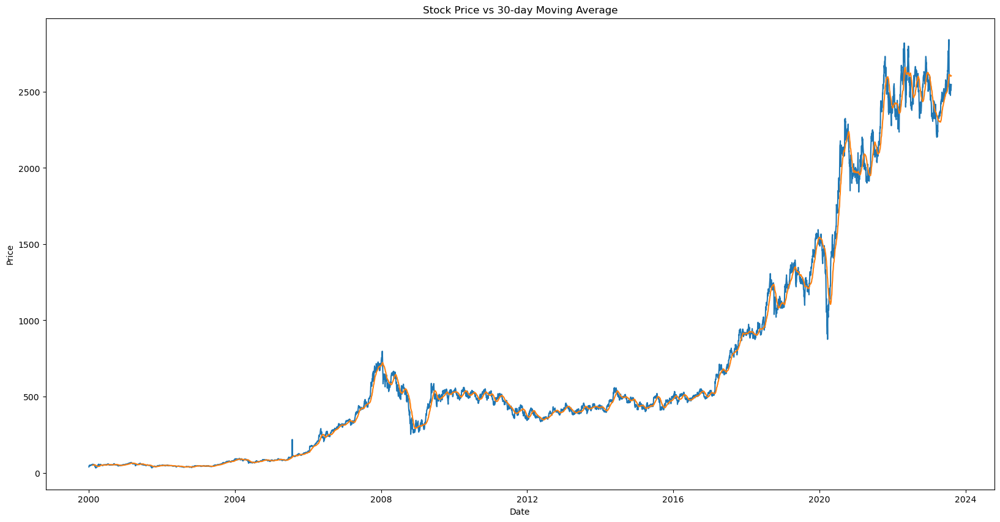

In [92]:
plt.figure(figsize=(20,10))
plt.plot(df_ma['Close'],label='Original data')
plt.plot(df_ma['30-day MA'],label='30-MA')
plt.legend
plt.title('Stock Price vs 30-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

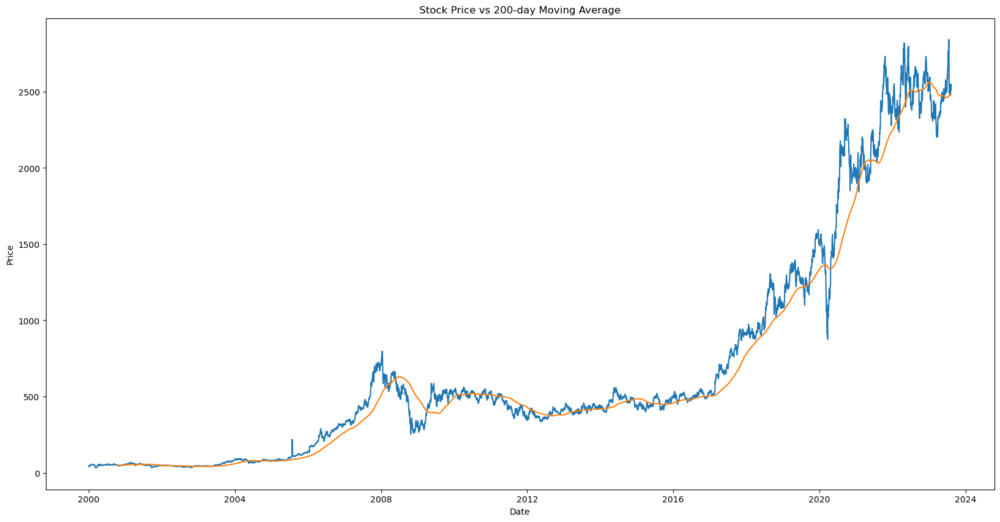

In [93]:
plt.figure(figsize=(20,10))
plt.plot(df_ma['Close'],label='Original data')
plt.plot(df_ma['200-day MA'],label='200-MA')
plt.legend
plt.title('Stock Price vs 200-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

Long term and short term trends can be identified using the Moving Average graphs
- In long term, Stock price is in upward trend
- Short term trends can be identified from MA-30 chart
- Stock had a major short term downtrend during the year 2020
- It may be due to the bearish market during the Covid-19 outbraek

## Model Building

In [94]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [95]:
df

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010.0
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457.0
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953.0
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113.0
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756.0
...,...,...,...,...,...
2023-08-07,2521.000000,2528.399902,2505.000000,2523.850098,2991435.0
2023-08-08,2528.000000,2534.449951,2499.550049,2508.649902,4922036.0
2023-08-09,2504.850098,2529.000000,2481.100098,2525.199951,5743293.0


In [96]:
# Creating dataframe which only includes date and close time

close_df=pd.DataFrame(df['Close'])
close_df

,Close
Date,
2000-01-03,38.944569
2000-01-04,42.062302
2000-01-05,43.710136
2000-01-06,45.543640
2000-01-07,48.669109
...,...
2023-08-07,2523.850098
2023-08-08,2508.649902
2023-08-09,2525.199951


In [97]:
print(close_df.shape)

(5907, 1)


In [98]:
close_df=close_df.reset_index()

In [99]:
close_df

,Date,Close
0,2000-01-03,38.944569
1,2000-01-04,42.062302
2,2000-01-05,43.710136
3,2000-01-06,45.543640
4,2000-01-07,48.669109
...,...,...
5902,2023-08-07,2523.850098
5903,2023-08-08,2508.649902
5904,2023-08-09,2525.199951
5905,2023-08-10,2536.449951


In [100]:
close_df['Date']

0      2000-01-03
1      2000-01-04
2      2000-01-05
3      2000-01-06
4      2000-01-07
          ...    
5902   2023-08-07
5903   2023-08-08
5904   2023-08-09
5905   2023-08-10
5906   2023-08-11
Name: Date, Length: 5907, dtype: datetime64[ns]

### Normalizing / scaling close value between 0 to 1

In [101]:
close_stock = close_df.copy()
del close_df['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(close_df).reshape(-1,1))
print(closedf.shape)

(5907, 1)


In [102]:
closedf

array([[0.00267015],
       [0.0037795 ],
       [0.00436583],
       ...,
       [0.88732954],
       [0.89133252],
       [0.89513978]])

### Split data for training and testing
- Ratio for training and testing data is 86:14

In [103]:
training_size=int(len(closedf)*0.86)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (5080, 1)
test_data:  (827, 1)


In [104]:
training_size,test_size

(5080, 827)

### Create new dataset according to requirement of time-series prediction

In [105]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [106]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 13
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (5066, 13)
y_train:  (5066,)
X_test:  (813, 13)
y_test (813,)


## Algorithms

## Support vector regression - SVR

In [107]:
import math
from sklearn.svm import SVR

svr_rbf = SVR(kernel= 'rbf', C= 1e3, gamma= 0.01)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.01)

In [108]:
# Lets Do the prediction 

train_predict=svr_rbf.predict(X_train)
test_predict=svr_rbf.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5066, 1)
Test data prediction: (813, 1)


In [109]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE

Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [110]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))


Train data RMSE:  183.06039507295537
Train data MSE:  33511.10824426651
Test data MAE:  166.92892740049976
-------------------------------------------------------------------------------------
Test data RMSE:  527.7839655697231
Test data MSE:  278555.9143125027
Test data MAE:  512.4586691728489


### Explained variance regression score

The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [111]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.8872568011433491
Test data explained variance regression score: 0.807787371481091


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best

0 or < 0 = worse

In [112]:
train_r2_svr=r2_score(original_ytrain, train_predict)
test_r2_svr=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_svr)
print("Test data R2 score:", test_r2_svr)

Train data R2 score: 0.7195102916993872
Test data R2 score: -2.3585418893105268


### Comparision between original stock close price vs predicted close price

In [113]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5907, 1)
Test predicted data:  (5907, 1)


### Predicting next 30 days

In [118]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = svr_rbf.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = svr_rbf.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [119]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [120]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [121]:
svrdf=closedf.tolist()
svrdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
svrdf=scaler.inverse_transform(svrdf).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(svrdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## Random Forest Regressor - RF

In [122]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

In [123]:
# Lets Do the prediction 

train_predict=regressor.predict(X_train)
test_predict=regressor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5066, 1)
Test data prediction: (813, 1)


In [124]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [125]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  4.614405015890165
Train data MSE:  21.292733650672314
Test data MAE:  2.5197227447670922
-------------------------------------------------------------------------------------
Test data RMSE:  780.0668048697448
Test data MSE:  608504.2200596925
Test data MAE:  728.2287486159653


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [126]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9998217989431538
Test data explained variance regression score: 0.04735056735057119


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [127]:
train_r2_rf=r2_score(original_ytrain, train_predict)
test_r2_rf=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_rf)
print("Test data R2 score:", test_r2_rf)

Train data R2 score: 0.9998217787186545
Test data R2 score: -6.336720593194668


### Comparision between original stock close price vs predicted close price

In [128]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5907, 1)
Test predicted data:  (5907, 1)


### Predicting next 30 days

In [129]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = regressor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = regressor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))


Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [130]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [131]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [132]:
rfdf=closedf.tolist()
rfdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
rfdf=scaler.inverse_transform(rfdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(rfdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### K-nearest neighgbour - KNN

In [133]:
from sklearn import neighbors

K = time_step
neighbor = neighbors.KNeighborsRegressor(n_neighbors = K)
neighbor.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=13)

In [134]:
# Lets Do the prediction 

train_predict=neighbor.predict(X_train)
test_predict=neighbor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5066, 1)
Test data prediction: (813, 1)


In [135]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [136]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  14.126657027909276
Train data MSE:  199.56243878417854
Test data MAE:  7.651864340884934
-------------------------------------------------------------------------------------
Test data RMSE:  802.0327775485292
Test data MSE:  643256.5762622086
Test data MAE:  751.0637685258775


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [137]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9983300046345535
Test data explained variance regression score: 0.040829785254515305


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [138]:
train_r2_knn=r2_score(original_ytrain, train_predict)
test_r2_knn=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_knn)
print("Test data R2 score:", test_r2_knn)

Train data R2 score: 0.9983296520713573
Test data R2 score: -6.75572890736548


### Comparision between original stock close price vs predicted close price

In [139]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5907, 1)
Test predicted data:  (5907, 1)


### Predicting next 30 days

In [140]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = neighbor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = neighbor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [141]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [142]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### Plotting whole closing stock price with prediction

In [143]:
knndf=closedf.tolist()
knndf.extend((np.array(lst_output).reshape(-1,1)).tolist())
knndf=scaler.inverse_transform(knndf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(knndf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### LSTM

In [144]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (5066, 13, 1)
X_test:  (813, 13, 1)


### LSTM model structure

In [145]:
tf.keras.backend.clear_session()
LSTM_model=Sequential()
LSTM_model.add(LSTM(32,return_sequences=True,input_shape=(time_step,1)))
LSTM_model.add(LSTM(32,return_sequences=True))
LSTM_model.add(LSTM(32))
LSTM_model.add(Dense(1))
LSTM_model.compile(loss='mean_squared_error',optimizer='adam')

In [146]:
LSTM_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 13, 32)            4352      
                                                                 
 lstm_1 (LSTM)               (None, 13, 32)            8320      
                                                                 
 lstm_2 (LSTM)               (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 21025 (82.13 KB)
Trainable params: 21025 (82.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [147]:
LSTM_model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
159/159 [==============================] - 11s 25ms/step - loss: 0.0017 - val_loss: 0.0043
Epoch 2/100
159/159 [==============================] - 3s 17ms/step - loss: 1.0908e-04 - val_loss: 0.0039
Epoch 3/100
159/159 [==============================] - 3s 17ms/step - loss: 1.2350e-04 - val_loss: 0.0048
Epoch 4/100
159/159 [==============================] - 3s 17ms/step - loss: 1.1631e-04 - val_loss: 0.0076
Epoch 5/100
159/159 [==============================] - 3s 17ms/step - loss: 1.1458e-04 - val_loss: 0.0036
Epoch 6/100
159/159 [==============================] - 3s 17ms/step - loss: 1.2285e-04 - val_loss: 0.0073
Epoch 7/100
159/159 [==============================] - 3s 17ms/step - loss: 1.0169e-04 - val_loss: 0.0053
Epoch 8/100
159/159 [==============================] - 3s 16ms/step - loss: 1.0870e-04 - val_loss: 0.0030
Epoch 9/100
159/159 [==============================] - 3s 17ms/step - loss: 1.1885e-04 - val_loss: 0.0021
Epoch 10/100
159/159 [===========================

159/159 [==============================] - 3s 17ms/step - loss: 1.9458e-05 - val_loss: 0.0016
Epoch 77/100
159/159 [==============================] - 3s 16ms/step - loss: 2.0165e-05 - val_loss: 0.0016
Epoch 78/100
159/159 [==============================] - 3s 16ms/step - loss: 2.1832e-05 - val_loss: 5.4933e-04
Epoch 79/100
159/159 [==============================] - 3s 16ms/step - loss: 2.1161e-05 - val_loss: 0.0013
Epoch 80/100
159/159 [==============================] - 3s 16ms/step - loss: 2.1829e-05 - val_loss: 0.0014
Epoch 81/100
159/159 [==============================] - 3s 16ms/step - loss: 2.0510e-05 - val_loss: 0.0011
Epoch 82/100
159/159 [==============================] - 3s 16ms/step - loss: 2.0378e-05 - val_loss: 5.8041e-04
Epoch 83/100
159/159 [==============================] - 3s 16ms/step - loss: 2.1335e-05 - val_loss: 6.7719e-04
Epoch 84/100
159/159 [==============================] - 3s 16ms/step - loss: 2.1947e-05 - val_loss: 0.0013
Epoch 85/100
159/159 [================

In [148]:
### Lets Do the prediction and check performance metrics
train_predict=LSTM_model.predict(X_train)
test_predict=LSTM_model.predict(X_test)
train_predict.shape, test_predict.shape

26/26 [==============================] - 0s 7ms/step


((5066, 1), (813, 1))

In [149]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [150]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  12.966720529492346
Train data MSE:  168.13584128995825
Test data MAE:  8.412399366981957
-------------------------------------------------------------------------------------
Test data RMSE:  103.87075826952227
Test data MSE:  10789.134423485528
Test data MAE:  92.73263766047816


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [151]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9988745883882785
Test data explained variance regression score: 0.9703067914089849


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [152]:
train_r2_lstm=r2_score(original_ytrain, train_predict)
test_r2_lstm=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_lstm)
print("Test data R2 score:", test_r2_lstm)

Train data R2 score: 0.998592694316925
Test data R2 score: 0.8699156684570459


### Comparision between original stock close price vs predicted close price

In [153]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5907, 1)
Test predicted data:  (5907, 1)


### Predicting next 30 days

In [154]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = LSTM_model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = LSTM_model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [155]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [156]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [157]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### GRU (Gated Recurrent Unit)

In [158]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (5066, 13, 1)
X_test:  (813, 13, 1)


In [159]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(GRU(32,return_sequences=True,input_shape=(time_step,1)))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [160]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 13, 32)            3360      
                                                                 
 gru_1 (GRU)                 (None, 13, 32)            6336      
                                                                 
 gru_2 (GRU)                 (None, 13, 32)            6336      
                                                                 
 gru_3 (GRU)                 (None, 32)                6336      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 22401 (87.50 KB)
Trainable params: 22401 (87.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [161]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
159/159 [==============================] - 14s 33ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 2/100
159/159 [==============================] - 4s 24ms/step - loss: 7.4119e-05 - val_loss: 0.0015
Epoch 3/100
159/159 [==============================] - 4s 23ms/step - loss: 6.5704e-05 - val_loss: 0.0016
Epoch 4/100
159/159 [==============================] - 4s 23ms/step - loss: 6.1418e-05 - val_loss: 0.0010
Epoch 5/100
159/159 [==============================] - 4s 22ms/step - loss: 6.1917e-05 - val_loss: 0.0016
Epoch 6/100
159/159 [==============================] - 4s 23ms/step - loss: 5.5104e-05 - val_loss: 0.0021
Epoch 7/100
159/159 [==============================] - 4s 23ms/step - loss: 4.9942e-05 - val_loss: 9.5113e-04
Epoch 8/100
159/159 [==============================] - 4s 23ms/step - loss: 4.4616e-05 - val_loss: 4.5035e-04
Epoch 9/100
159/159 [==============================] - 4s 22ms/step - loss: 4.2468e-05 - val_loss: 9.1814e-04
Epoch 10/100
159/159 [===============

159/159 [==============================] - 4s 22ms/step - loss: 2.1731e-05 - val_loss: 0.0011
Epoch 77/100
159/159 [==============================] - 4s 23ms/step - loss: 2.2185e-05 - val_loss: 0.0022
Epoch 78/100
159/159 [==============================] - 4s 23ms/step - loss: 2.8160e-05 - val_loss: 0.0017
Epoch 79/100
159/159 [==============================] - 4s 22ms/step - loss: 2.1035e-05 - val_loss: 0.0013
Epoch 80/100
159/159 [==============================] - 4s 24ms/step - loss: 2.1622e-05 - val_loss: 0.0025
Epoch 81/100
159/159 [==============================] - 4s 24ms/step - loss: 2.7425e-05 - val_loss: 0.0031
Epoch 82/100
159/159 [==============================] - 4s 25ms/step - loss: 2.3140e-05 - val_loss: 0.0012
Epoch 83/100
159/159 [==============================] - 4s 23ms/step - loss: 2.2271e-05 - val_loss: 0.0013
Epoch 84/100
159/159 [==============================] - 4s 23ms/step - loss: 2.4141e-05 - val_loss: 0.0033
Epoch 85/100
159/159 [============================

In [162]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

26/26 [==============================] - 0s 8ms/step


((5066, 1), (813, 1))

In [163]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1))

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [164]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  11.455351129841016
Train data MSE:  131.22506950794985
Test data MAE:  6.4912706756462635
-------------------------------------------------------------------------------------
Test data RMSE:  128.74956057513353
Test data MSE:  16576.44934828998
Test data MAE:  114.4075235790571


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [165]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9989018421019112
Test data explained variance regression score: 0.9545247526135486


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [166]:
train_r2_gru=r2_score(original_ytrain, train_predict)
test_r2_gru=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_gru)
print("Test data R2 score:", test_r2_gru)

Train data R2 score: 0.9989016393847759
Test data R2 score: 0.8001381530538652


### Comparision between original stock close price vs predicted close price

In [167]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)


names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5907, 1)
Test predicted data:  (5907, 1)


In [168]:
plotdf.head(100)

,Date,original_close,train_predicted_close,test_predicted_close
0,2000-01-03,38.944569,NaN,NaN
1,2000-01-04,42.062302,NaN,NaN
2,2000-01-05,43.710136,NaN,NaN
3,2000-01-06,45.543640,NaN,NaN
4,2000-01-07,48.669109,NaN,NaN
...,...,...,...,...
95,2000-05-15,49.435001,50.512840,NaN
96,2000-05-16,49.110077,50.902016,NaN
97,2000-05-17,49.334431,50.678997,NaN
98,2000-05-18,47.980576,50.749645,NaN


### Predicting next 30 days

In [169]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [170]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [171]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})
names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [172]:
grudf=closedf.tolist()
grudf.extend((np.array(lst_output).reshape(-1,1)).tolist())
grudf=scaler.inverse_transform(grudf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])
fig = px.line(grudf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [173]:
finaldf = pd.DataFrame({
    'svr':svrdf,
    'rf':rfdf,
    'knn':knndf,
    'lstm':lstmdf,
    'gru':grudf,
})
finaldf

,svr,rf,knn,lstm,gru
0,38.944569,38.944569,38.944569,38.944569,38.944569
1,42.062302,42.062302,42.062302,42.062302,42.062302
2,43.710136,43.710136,43.710136,43.710136,43.710136
3,45.543640,45.543640,45.543640,45.543640,45.543640
4,48.669109,48.669109,48.669109,48.669109,48.669109
...,...,...,...,...,...
5932,1162.982182,1567.761704,1557.162738,1402.106626,1458.046746
5933,1146.835534,1570.208512,1557.162738,1385.831101,1447.883368
5934,1132.407486,1562.666981,1557.162738,1370.166162,1438.236603
5935,1118.509783,1558.778342,1557.162738,1355.066832,1429.067417


### Conclusion Chart

In [174]:
names = cycle(['SVR', 'RF','KNN','LSTM','GRU'])

fig = px.line(finaldf[225:], x=finaldf.index[225:], y=[finaldf['svr'][225:],finaldf['rf'][225:], finaldf['knn'][225:], 
                                          finaldf['lstm'][225:], finaldf['gru'][225:],],
             labels={'x': 'Timestamp','value':'Stock close price'})
fig.update_layout(title_text='Final stock analysis chart', font_size=15, font_color='black',legend_title_text='Algorithms')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [111]:
data={"Model": ["SVR", "Random Forest", "KNN", "LSTM", "GRU"],
    "Train R2 Score": [train_r2_svr, train_r2_rf,train_r2_knn, train_r2_lstm, train_r2_gru],
    "Test R2 Score": [test_r2_svr, test_r2_rf, test_r2_knn, test_r2_lstm, test_r2_gru]}
df=pd.DataFrame(data)
df

,Model,Train R2 Score,Test R2 Score
0,SVR,0.719510,-2.358542
1,Random Forest,0.999822,-6.336721
2,KNN,0.998330,-6.755729
3,LSTM,0.998707,0.876665
4,GRU,0.998251,0.704503


## By Looking into this table we can say that our LSTM model have best R2 score.

## so we are going to use LSTM model for our deployment part.